In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("../../../src/")

import os
import pandas as pd
import numpy as np
import random
from eda.utils_plot import get_upack_patch, save2pdf, visualize_col_data
from eda.general_eda import general_stats, general_eda_main

# Stats computation & analysis of AI4boundaries dataset

In [2]:
SENTINEL2_DIR = "ai4boundaries_dataset" # your path here

## Luxembourg (LU)

In [3]:
country = "LU"

#### General EDA for the country

General information: 
          n_fields  prc_fields  sm_area_cnt  bg_area_cnt  sm_solidity_cnt  \
count  132.000000  132.000000   132.000000   132.000000       132.000000   
mean   221.507576   49.925000    54.583333     0.045455         0.234848   
std     83.064630   19.228217    24.409997     0.242872         0.522178   
min     15.000000    2.100000     2.000000     0.000000         0.000000   
25%    172.000000   35.350000    36.000000     0.000000         0.000000   
50%    226.000000   51.450000    53.500000     0.000000         0.000000   
75%    273.000000   64.750000    69.000000     0.000000         0.000000   
max    419.000000   87.400000   141.000000     2.000000         3.000000   

       bg_solidity_cnt  sm_eccentricity_cnt    area_min   area_mean  \
count       132.000000            132.00000  132.000000  132.000000   
mean        111.757576              9.30303    1.083333  149.835410   
std          43.434275              4.95004    0.801160   38.093459   
min     

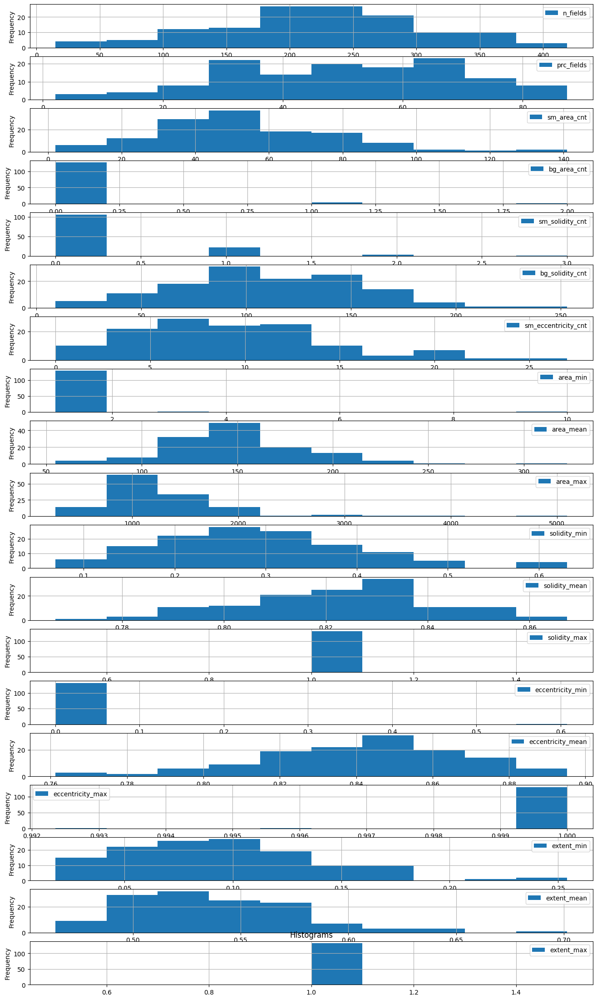

Total number of fields 0.03 M
Total area of fields in ha 4.32 M
Number of patches without fields present 0 (0.0%)
Number of patches with small percentage  (< 10) of fields present 3 (2.27%)
Number of patches with small number (< 40) of fields present 3 (2.27%)
Number of patches with small number or small percentage of fields present combined 3 (2.27%)
Number of patches with small number & small percentage of fields present combined 3 (2.27%)
Number of patches with n_fields (>= 387.64) of fields present 2 (1.52%)
Number of patches with n_fields (< 55.38) of fields present 4 (3.03%)
Number of patches with prc_fields (>= 75.0) of fields present 14 (10.61%)
Number of patches with prc_fields (< 25.0) of fields present 10 (7.58%)
Number of patches with sm_area_cnt (>= 103.4) of fields present 4 (3.03%)
Number of patches with sm_area_cnt (< 5.76) of fields present 1 (0.76%)
Number of patches with bg_area_cnt (>= 0.53) of fields present 5 (3.79%)
Number of patches with sm_solidity_cnt (>= 1.28

In [4]:
data = general_eda_main(SENTINEL2_DIR, country,
                     sm_prc_fields=10, sm_num_fields=40)

### Visualizations of the country data

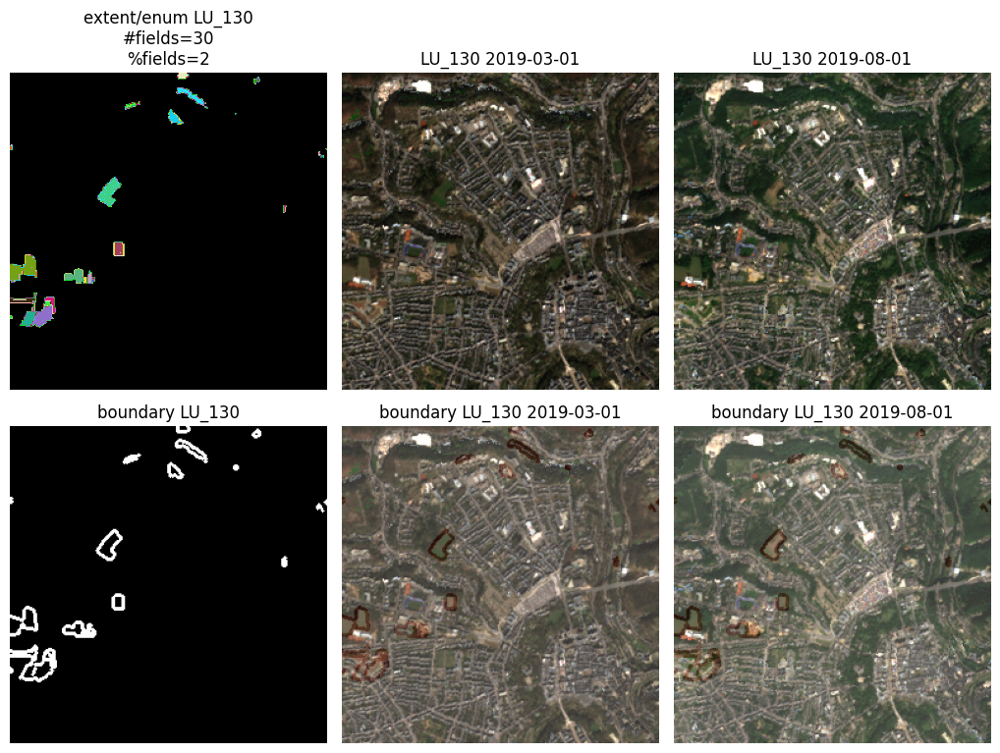

In [12]:
# visualize the data with small number of fields (<40)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_num_fields', num_img=2,
                       num_plots=1) # montains, in the city

In [ ]:
# visualize the data with small % of fields (<10%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_prc_fields', num_img=2,
                       num_plots=1) # no interset -> same as 'sm_num_fields'

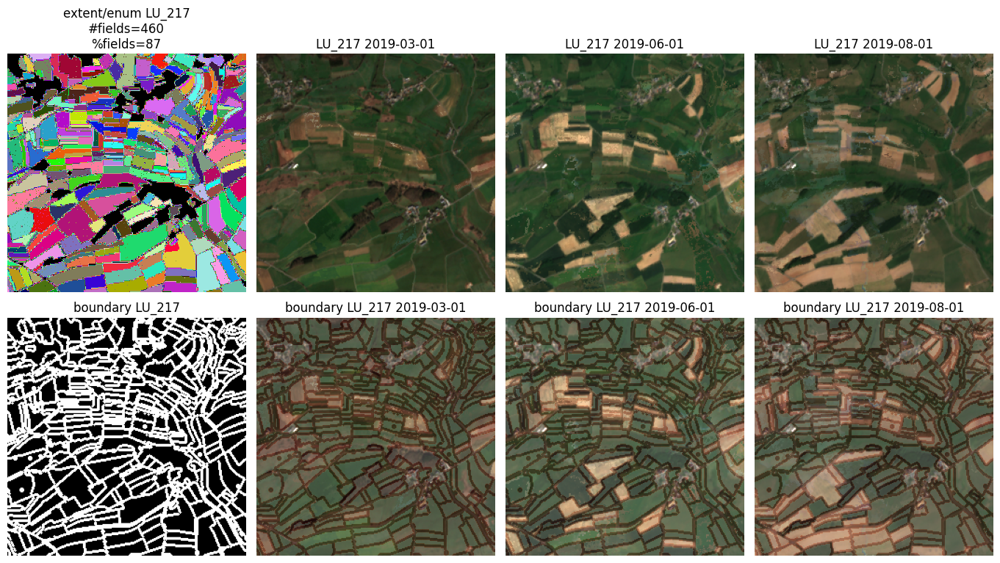

In [19]:
# visualze patches with a lot of fields present
# Number of patches with n_fields (>= 387.64) of fields present 2 (1.52%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='n_fields_gt', num_img=3,
                       num_plots=1) # small parcels

In [ ]:
# visualze patches with a lot of % fields present
# Number of patches with prc_fields (>= 75.0) of fields present 14 (10.61%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='prc_fields_gt', num_img=3,
                       num_plots=1) # no interest -> same vis as for 'n_fields_gt'

In [ ]:
# visualze the patches with #field small area > 103
# Number of patches with sm_area_cnt (>= 103.4) of fields present 4 (3.03%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_area_cnt_gt', num_img=1,
                       num_plots=1) # no intresent -> same vis as for 'n_fields_gt'

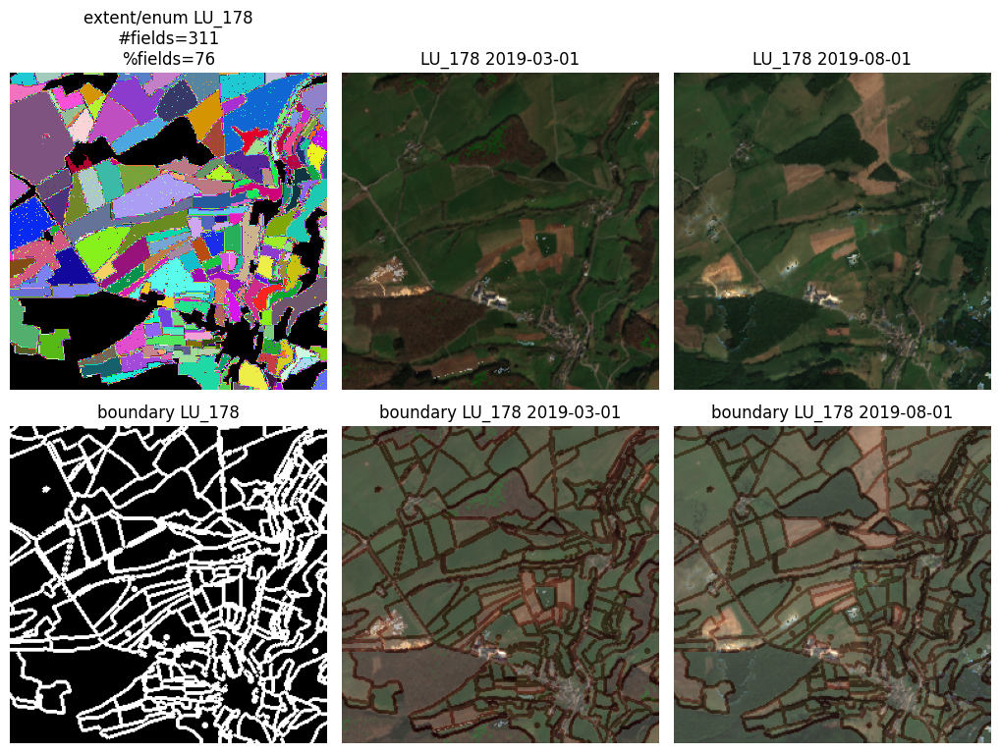

In [30]:
# visualze the patches with the following rool
# Number of patches with bg_area_cnt (>= 0.53) of fields present 5 (3.79%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_area_cnt_gt', num_img=2,
                       num_plots=1) # couple of bigs parcels with majority small in the neighbourhood

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_solidity_cnt (>= 1.28) of fields present 4 (3.03%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_solidity_cnt_gt', num_img=1,
                       num_plots=1) # not much info

In [ ]:
# visualze the patches with the following rool
# Number of patches with bg_solidity_cnt (>= 198.63) of fields present 4 (3.03%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_solidity_cnt_gt', num_img=2,
                       num_plots=1) # no much intersent (rectangular/almost square compact fields)

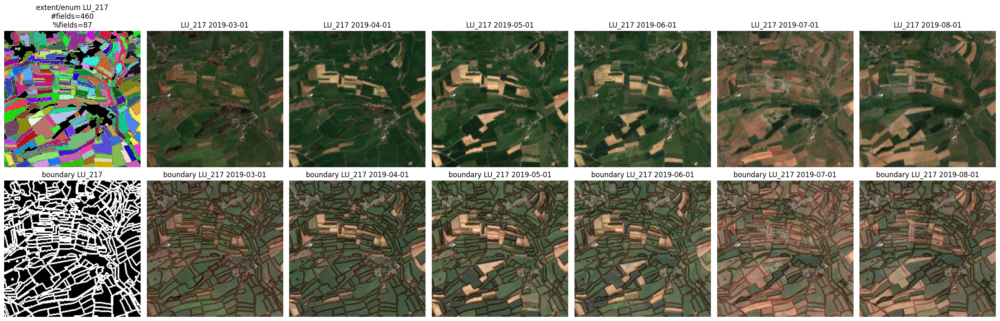

In [38]:
# visualze the patches with the following rool
# Number of patches with sm_eccentricity_cnt (>= 19.2) of fields present 6 (4.55%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_eccentricity_cnt_gt', num_img=6,
                       num_plots=1) # no intreset (small parcels, isolated fields, ...)

### Conclusion for the country (LU)


Isolated fields (cause of location in montains/towns):

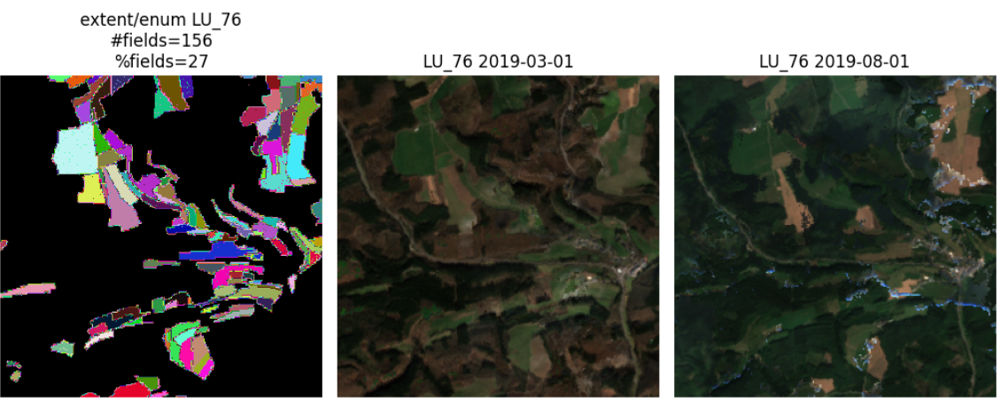

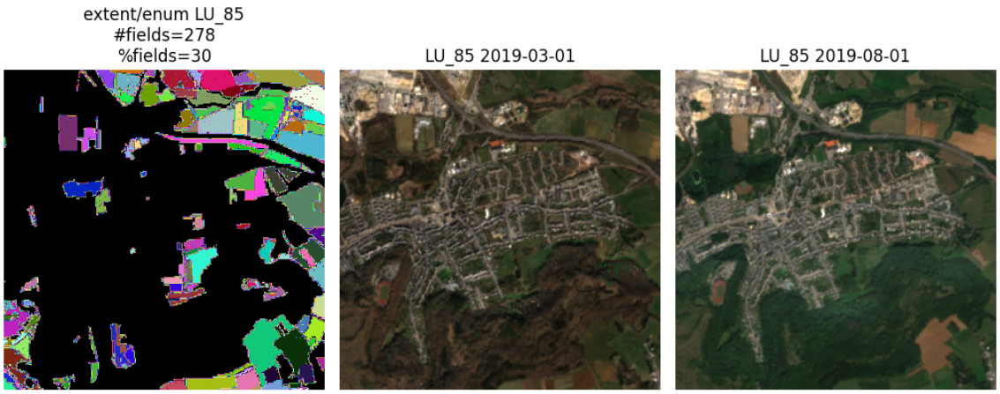

Very Small parcels for fields (regular rect / square):

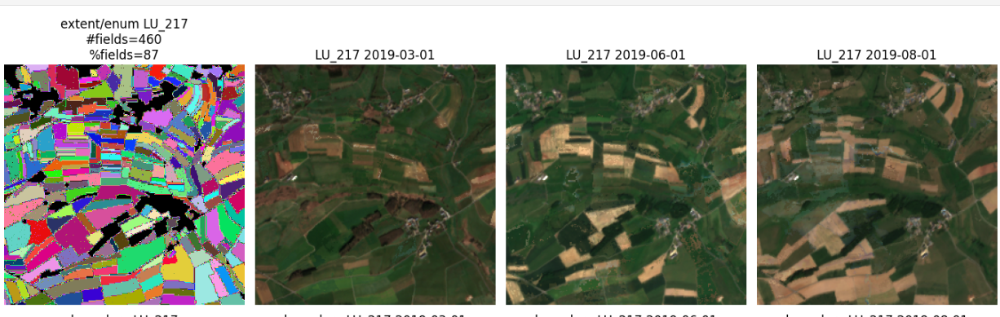

Based on eccentricity visualizations -> no circular fields. 

__TO BE DELETED__: (Number of patches without fields present __0__ (No smaples without fields!!!!!!!!!!)) +
(Number of patches with small number or small percentage of fields present combined 3 (2.27%)) -> ~3% delete for the training data (clouds artifacts, forest or other greenary/ montains, not clear if there shoud be a field a not).
